# Initialize

In [104]:
import os
import bbknn
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sbn
from natsort import natsorted
import scanpy.external as sce
import matplotlib.pyplot as plt
from IPython.display import clear_output

from Skin_scripts import *

In [35]:
main_path = '/mnt/storage/karla/data/hao/'
full_data = sc.read_h5ad(os.path.join(main_path, 'KC_Individually_scaled_FilteredGenes.h5ad'))
full_data

AnnData object with n_obs × n_vars = 254591 × 33665
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleType', 'SampledSiteCondition', 'Tissue', 'LibraryPlatform', 'StrandSequence', 'SequencingPlatform', 'Refer

In [58]:
#Where do we have SampleID the same as DonorID
filter_list = full_data.obs['SampleID'].astype(object) == full_data.obs['DonorID'].values.astype(object)
full_data.obs['SampleID_corrected'] = np.where(filter_list, #Where the SampleID == DonorID
                                               full_data.obs['DonorID'].astype(str)+'_'+full_data.obs['AnatomicalRegionLevel1'].astype(str), #if True, combine the information of DonorID (includes StudyID) + bodysite information
                                               full_data.obs['StudyID'].astype(str)+'___'+full_data.obs['SampleID'].astype(str)) #Otherwise, if the SampleID was already unique, combine it with StudyID to make the nomenclature consistent
pd.DataFrame(full_data.obs['SampleID_corrected']).to_csv(os.path.join(main_path, 'KC_Full_dataset_SampleID_corrected.csv'))
full_data.obs['SampleID_corrected']

AAAGCAATCAATAAGG-1---Wiedemann_Andersen_CellReports_2023                    Wiedemann_Andersen_CellReports_2023___GSM6111844
AAAGTAGAGATGCCTT-1---Wiedemann_Andersen_CellReports_2023                    Wiedemann_Andersen_CellReports_2023___GSM6111844
AAAGTAGGTGTAAGTA-1---Wiedemann_Andersen_CellReports_2023                    Wiedemann_Andersen_CellReports_2023___GSM6111844
AAATGCCTCCTATGTT-1---Wiedemann_Andersen_CellReports_2023                    Wiedemann_Andersen_CellReports_2023___GSM6111844
AACCATGAGAAAGTGG-1---Wiedemann_Andersen_CellReports_2023                    Wiedemann_Andersen_CellReports_2023___GSM6111844
                                                                                                 ...                        
TTTGTCAGTGACTACT-1---UCSFSKIN12_SCALP32epi---Cheng_Cho_CellReports_2018    Cheng_Cho_CellReports_2018___UCSFSKIN12_SCALP3...
TTTGTCAGTGGACGAT-1---UCSFSKIN12_SCALP32epi---Cheng_Cho_CellReports_2018    Cheng_Cho_CellReports_2018___UCSFSKIN12_SCALP3...


In [9]:
from multiprocessing import Pool, cpu_count
import scipy

# Define the paths
main_path = '/mnt/storage/karla/data/hao/'
output_path = os.path.join(main_path, 'Individual_KC_samples_scaled')
studies = os.listdir(os.path.join(main_path, 'Individual_datasets'))
sampleID_corrected = pd.read_csv(os.path.join(main_path, 'KC_Full_dataset_SampleID_corrected.csv'), index_col=0)

# Function to process each sample
def process_sample(sample, study_data, sampleID_corrected, output_path):
    print(sample)
    samp_data = study_data[study_data.obs['SampleID_corrected'] == sample].copy()
    sc.pp.normalize_total(samp_data)
    sc.pp.log1p(samp_data)
    samp_dataX = scipy.sparse.csr_matrix(np.nan_to_num(samp_data.X, nan = 0.0))
    samp_data.layers['log-norm'] = samp_data.X.copy()
    sc.pp.scale(samp_data, zero_center=True)
    samp_data.X = scipy.sparse.csr_matrix(np.nan_to_num(samp_data.X, nan = 0.0))
    samp_data.layers['scaled'] = samp_data.X.copy()
    samp_data.write_h5ad(os.path.join(output_path, f'{sample}_KC_scaled.h5ad'))

# Function to process each study
def process_study(study):
    print(study)
    study_data = sc.read_h5ad(os.path.join(main_path, 'Individual_datasets', study))
    study_data.X = study_data.layers['raw_counts'].copy()  # Looks like raw counts are not log - so actually raw
    study_data.X = scipy.sparse.csr_matrix(np.nan_to_num(study_data.X, nan = 0.0))
    kc_cells = study_data.obs_names.intersection(sampleID_corrected.index)
    study_data = study_data[kc_cells].copy()
    study_data.obs['SampleID_corrected'] = sampleID_corrected.loc[kc_cells]
    
    samples = study_data.obs['SampleID_corrected'].unique()
    for sample in samples:
        process_sample(sample, study_data, sampleID_corrected, output_path)

with Pool(processes=min(len(studies), cpu_count())) as pool:
    pool.map(process_study, studies)



Ning.h5adTheocharidis_Bhasin_NatureCommunications_2022.h5adAlkon_Stingl_JournalofAllergyandClinicalImmunology_2022.h5adXu_Chen_Nature_2022.h5adRojahn_Brunner_JournalofAllergyandClinicalImmunology_2020.h5adReynolds_Haniffa_Science_2021Zou_Liu_DevelopmentalCell_2020.h5adBoothby_Rosenblum_Nature_2021.h5adGao_Hu_CellDeathDisease_2021.h5adKim_Nagao_NatureMedicine_2020.h5adTakahashi_Lowry_JournalofInvestigativeDermatology_2020.h5adRindler_Brunner_MolecularCancer_2021.h5adBoldo_Lyko_CommunicationsBiology_2020.h5adSS3_HumanSkin_20K.h5adBelote_Torres_NatureCellBiology_2021.h5adHughes_Shalek_Immunity_2020.h5ad
Ji_Khavari_Cell_2020.h5ad
Vorstandlechner_Mildner_NatureCommunications_2021.h5adHe_Guttman_JournalofAllergyandClinicalImmunology_2020.h5ad
Gaydosik_Fuschiotti_ClinicalCancerResearch_2019.h5ad
Cheng_Cho_CellReports_2018.h5ad

Wang_Atwood_NatureCommunications_2020.h5ad
Tabib_Lafyatis_NatureCommunications_2021.h5ad


Dunlap_Rao_JCIInsight_2022.h5adWiedemann_Andersen_CellReports_2023.h5ad






IsADirectoryError: [Errno 21] Unable to synchronously open file (file read failed: time = Thu Aug 15 09:47:32 2024
, filename = '/mnt/storage/karla/data/hao/Individual_datasets/Reynolds_Haniffa_Science_2021', file descriptor = 170, errno = 21, error message = 'Is a directory', buf = 0x7ffc9d822370, total read size = 8, bytes this sub-read = 8, bytes actually read = 18446744073709551615, offset = 0)

In [10]:
completed_samples = [f.split('_KC')[0] for f in os.listdir(output_path)]
all_samples = sampleID_corrected['SampleID_corrected'].unique()
set([f.split('__')[0]+'.h5ad' for f in all_samples if f not in completed_samples])

{'Kim_Nagao_NatureMedicine_2020.h5ad'}

In [11]:
#Handle Kim_Nagao_NatureMedicine_2020 separately, because it always causes an issue.
full_data = sc.read_h5ad(os.path.join(main_path, 'KC_Individually_scaled_FilteredGenes.h5ad'))
full_data

AnnData object with n_obs × n_vars = 254591 × 33665
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleType', 'SampledSiteCondition', 'Tissue', 'LibraryPlatform', 'StrandSequence', 'SequencingPlatform', 'Refer

In [12]:
study_data = full_data[full_data.obs['StudyID']=='Kim_Nagao_NatureMedicine_2020'].copy()
study_data.X = study_data.layers['raw_counts'].copy()  # Looks like raw counts are not log - so actually raw
study_data.X = scipy.sparse.csr_matrix(np.nan_to_num(study_data.X, nan = 0.0))
kc_cells = study_data.obs_names.intersection(sampleID_corrected.index)
study_data = study_data[kc_cells].copy()
study_data.obs['SampleID_corrected'] = sampleID_corrected.loc[kc_cells]

samples = study_data.obs['SampleID_corrected'].unique()
for sample in samples:
    process_sample(sample, study_data, sampleID_corrected, output_path)

Kim_Nagao_NatureMedicine_2020___Kim_Nagao_NatureMedicine_2020___SKIN_HV1_duplicate1
Kim_Nagao_NatureMedicine_2020___Kim_Nagao_NatureMedicine_2020___SKIN_HV1_duplicate2
Kim_Nagao_NatureMedicine_2020___SKIN_HV2_Torso
Kim_Nagao_NatureMedicine_2020___SKIN_HV3_Torso
Kim_Nagao_NatureMedicine_2020___SKIN_HV4_Torso
Kim_Nagao_NatureMedicine_2020___SKIN_HV5_Torso


In [13]:
completed_samples = [f.split('_KC')[0] for f in os.listdir(output_path)]
all_samples = sampleID_corrected['SampleID_corrected'].unique()
set([f.split('__')[0]+'.h5ad' for f in all_samples if f not in completed_samples])

set()

In [ ]:
adata = sc.concat([sc.read_h5ad(os.path.join(output_path, f)) for f in os.listdir(output_path)], join = 'outer')

In [ ]:
adata.write_h5ad(os.path.join(main_path, 'KC_full_samples_scaled.h5ad'))

In [17]:
adata

AnnData object with n_obs × n_vars = 254591 × 75464
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleType', 'SampledSiteCondition', 'Tissue', 'LibraryPlatform', 'StrandSequence', 'SequencingPlatform', 'Refer

In [1]:
import os
import bbknn
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sbn
from natsort import natsorted
import scanpy.external as sce
import matplotlib.pyplot as plt
from IPython.display import clear_output

In [2]:
main_path = '/mnt/storage/karla/data/hao/'
adata = sc.read_h5ad(os.path.join(main_path, 'KC_full_samples_scaled.h5ad'))

In [3]:
adata

AnnData object with n_obs × n_vars = 254591 × 75464
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleType', 'SampledSiteCondition', 'Tissue', 'LibraryPlatform', 'StrandSequence', 'SequencingPlatform', 'Refer

In [14]:
def test_integrations(adata, hvg_batch = None, hvg_n_genes = None, hvg_layer = None, pca_use_highly_variable = True, pca_layer = None, harmony_bbknn_combinations = None):
    print(f'Running combinations of hvg_batch: {hvg_batch}; n_top_genes: {hvg_n_genes}; harmony+bbknn: {harmony_bbknn_combinations}')
    print('\tHVG')
    sc.pp.highly_variable_genes(adata, n_top_genes=hvg_n_genes, batch_key = hvg_batch, layer = hvg_layer)
    print('\tpca')
    sc.pp.pca(adata, use_highly_variable=pca_use_highly_variable, layer = pca_layer)

    def integrations_neighbors(adata, bbknn_batch, pca_name, integration_name):
        if isinstance(bbknn_batch, str):
            try:
                bbknn.bbknn(adata, batch_key = bbknn_batch, use_rep = pca_name, key_added = integration_name)
            except ValueError:
                min_n = adata.obs[bbknn_batch].value_counts().min()
                print(f'\tSetting neighbors_within_batch to {min_n} to account for all datasets')
                bbknn.bbknn(adata, batch_key = bbknn_batch, use_rep = pca_name, neighbors_within_batch = min_n, key_added = integration_name)
        else:
            sc.pp.neighbors(adata, use_rep = pca_name, key_added = integration_name)

    def integration_clustering_umap(adata, integration_name):
        if f'leiden_{integration_name}' in adata.obs.columns:
            print('\tSkipping leiden')
        else:
            print('\tleiden')
            sc.tl.leiden(adata, key_added=f'leiden_{integration_name}', neighbors_key = integration_name)
        if f'X_umap_{integration_name}' in adata.obsm.keys():
            print('\tSkipping UMAP')
        else:
            print('\tumap')
            sc.tl.umap(adata, neighbors_key = integration_name)
            adata.obsm[f'X_umap_{integration_name}'] = adata.obsm['X_umap'].copy()
    
    def integration_combinations(adata, harmony_batch, bbknn_batch, hvg_n_genes, hvg_batch):
        if all([harmony_batch==None, bbknn_batch==None, hvg_batch==None]):
            integration_name = f'noCorrection_hvg{hvg_n_genes}'
            integration_name = f'X_pca_noCorrection_hvg{hvg_n_genes}'
        else:
            integration_name = f'harmony{harmony_batch}_bbknn{bbknn_batch}_hvg{hvg_n_genes}-{hvg_batch}'
            pca_name = f'X_pca_harmony{harmony_batch}_hvg{hvg_n_genes}-{hvg_batch}'
        
        print(f'\t{integration_name}')
        if all([isinstance(harmony_batch, str), pca_name not in adata.obsm.keys()]):
            sce.pp.harmony_integrate(adata, key = harmony_batch, adjusted_basis = pca_name)
        else:
            print(f'\tSkipping harmony {harmony_batch}')
        
        integrations_neighbors(adata, bbknn_batch, pca_name if isinstance(harmony_batch, str) else 'X_pca', integration_name)
        integration_clustering_umap(adata, integration_name)

    integration_combinations(adata, harmony_batch = harmony_bbknn_combinations[0], bbknn_batch = harmony_bbknn_combinations[1], hvg_n_genes = hvg_n_genes, hvg_batch = hvg_batch)
    integration_combinations(adata, harmony_batch = harmony_bbknn_combinations[1], bbknn_batch = harmony_bbknn_combinations[0], hvg_n_genes = hvg_n_genes, hvg_batch = hvg_batch)
    integration_combinations(adata, harmony_batch = harmony_bbknn_combinations[0], bbknn_batch = None, hvg_n_genes = hvg_n_genes, hvg_batch = hvg_batch)
    integration_combinations(adata, harmony_batch = harmony_bbknn_combinations[1], bbknn_batch = None, hvg_n_genes = hvg_n_genes, hvg_batch = hvg_batch)
    integration_combinations(adata, harmony_batch = None, bbknn_batch = None, hvg_n_genes = hvg_n_genes, hvg_batch = hvg_batch)

#combinations as (hvg_batch, hvg_n_genes, (harmony, bbknn)-combinations)
combinations = [('StudyID', 1000, ('SampleID', 'LibraryPlatform')), 
                ('StudyID', 2000, ('SampleID', 'LibraryPlatform')),
                ('StudyID', 2000, ('DonorID', 'LibraryPlatform')),
                ('StudyID', 4000, ('SampleID', 'LibraryPlatform')), 
                (None, 2000, ('SampleID', 'LibraryPlatform')), 
                ('DonorID', 2000, ('SampleID', 'LibraryPlatform')), 
                ('LibraryPlatform', 2000, ('SampleID', 'StudyID'))]

for hvg_batch, hvg_n_genes, harmony_bbknn_combinations in combinations:
    test_integrations(adata, hvg_batch = hvg_batch, hvg_n_genes = hvg_n_genes, hvg_layer = 'normalized', pca_use_highly_variable = True, 
                      pca_layer = None, harmony_bbknn_combinations = harmony_bbknn_combinations)


Running combinations of hvg_batch: StudyID; n_top_genes: 1000; harmony+bbknn: ('SampleID', 'LibraryPlatform')
	HVG
	pca


/mnt/storage/karla/mamba/minimamba/envs/integration/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


	harmonySampleID_bbknnLibraryPlatform_hvg1000-StudyID
	Skipping harmony SampleID
Skipping leiden
Skipping UMAP
	harmonyLibraryPlatform_bbknnSampleID_hvg1000-StudyID
	Skipping harmony LibraryPlatform
Skipping leiden
Skipping UMAP
	harmonySampleID_bbknnNone_hvg1000-StudyID
	Skipping harmony SampleID
	leiden
	umap
	harmonyLibraryPlatform_bbknnNone_hvg1000-StudyID
	Skipping harmony LibraryPlatform
	leiden
	umap
	harmonyNone_bbknnNone_hvg1000-StudyID
	Skipping harmony None
	leiden
	umap
Running combinations of hvg_batch: StudyID; n_top_genes: 2000; harmony+bbknn: ('SampleID', 'LibraryPlatform')
	HVG
	pca


/mnt/storage/karla/mamba/minimamba/envs/integration/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


	harmonySampleID_bbknnLibraryPlatform_hvg2000-StudyID


2024-08-15 18:06:32,563 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-15 18:07:16,356 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-15 18:07:19,100 - harmonypy - INFO - Iteration 1 of 10
2024-08-15 18:12:38,949 - harmonypy - INFO - Iteration 2 of 10
2024-08-15 18:18:35,600 - harmonypy - INFO - Iteration 3 of 10
2024-08-15 18:22:48,309 - harmonypy - INFO - Iteration 4 of 10
2024-08-15 18:26:00,414 - harmonypy - INFO - Iteration 5 of 10
2024-08-15 18:28:58,975 - harmonypy - INFO - Iteration 6 of 10
2024-08-15 18:31:53,716 - harmonypy - INFO - Converged after 6 iterations


	leiden
	umap
	harmonyLibraryPlatform_bbknnSampleID_hvg2000-StudyID


2024-08-15 18:47:03,235 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-15 18:47:38,654 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-15 18:47:40,891 - harmonypy - INFO - Iteration 1 of 10
2024-08-15 18:50:54,248 - harmonypy - INFO - Iteration 2 of 10
2024-08-15 18:54:28,550 - harmonypy - INFO - Converged after 2 iterations


	leiden
	umap
	harmonySampleID_bbknnNone_hvg2000-StudyID
	Skipping harmony SampleID
	leiden
	umap
	harmonyLibraryPlatform_bbknnNone_hvg2000-StudyID
	Skipping harmony LibraryPlatform
	leiden
	umap
	harmonyNone_bbknnNone_hvg2000-StudyID
	Skipping harmony None
	leiden
	umap
Running combinations of hvg_batch: StudyID; n_top_genes: 2000; harmony+bbknn: ('DonorID', 'LibraryPlatform')
	HVG
	pca


/mnt/storage/karla/mamba/minimamba/envs/integration/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


	harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID


2024-08-15 22:44:08,242 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-15 22:44:42,911 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-15 22:44:45,460 - harmonypy - INFO - Iteration 1 of 10
2024-08-15 22:50:11,393 - harmonypy - INFO - Iteration 2 of 10
2024-08-15 22:55:46,748 - harmonypy - INFO - Iteration 3 of 10
2024-08-15 22:59:53,322 - harmonypy - INFO - Iteration 4 of 10
2024-08-15 23:03:18,750 - harmonypy - INFO - Iteration 5 of 10
2024-08-15 23:06:16,957 - harmonypy - INFO - Iteration 6 of 10
2024-08-15 23:09:21,042 - harmonypy - INFO - Converged after 6 iterations


	leiden
	umap
	harmonyLibraryPlatform_bbknnDonorID_hvg2000-StudyID
	Skipping harmony LibraryPlatform
	leiden
	umap
	harmonyDonorID_bbknnNone_hvg2000-StudyID
	Skipping harmony DonorID
	leiden
	umap
	harmonyLibraryPlatform_bbknnNone_hvg2000-StudyID
	Skipping harmony LibraryPlatform
Skipping leiden
Skipping UMAP
	harmonyNone_bbknnNone_hvg2000-StudyID
	Skipping harmony None
Skipping leiden
Skipping UMAP
Running combinations of hvg_batch: StudyID; n_top_genes: 4000; harmony+bbknn: ('SampleID', 'LibraryPlatform')
	HVG
	pca


/mnt/storage/karla/mamba/minimamba/envs/integration/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


	harmonySampleID_bbknnLibraryPlatform_hvg4000-StudyID


2024-08-16 02:39:10,099 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-16 02:39:40,340 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-16 02:39:42,976 - harmonypy - INFO - Iteration 1 of 10
2024-08-16 02:45:40,000 - harmonypy - INFO - Iteration 2 of 10
2024-08-16 02:51:47,357 - harmonypy - INFO - Iteration 3 of 10
2024-08-16 02:57:41,682 - harmonypy - INFO - Iteration 4 of 10
2024-08-16 03:03:01,824 - harmonypy - INFO - Iteration 5 of 10
2024-08-16 03:07:20,538 - harmonypy - INFO - Iteration 6 of 10
2024-08-16 03:10:55,234 - harmonypy - INFO - Converged after 6 iterations


	leiden
	umap
	harmonyLibraryPlatform_bbknnSampleID_hvg4000-StudyID


2024-08-16 03:24:36,372 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-16 03:25:10,293 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-16 03:25:13,235 - harmonypy - INFO - Iteration 1 of 10
2024-08-16 03:28:46,099 - harmonypy - INFO - Iteration 2 of 10
2024-08-16 03:32:20,929 - harmonypy - INFO - Converged after 2 iterations


	leiden
	umap
	harmonySampleID_bbknnNone_hvg4000-StudyID
	Skipping harmony SampleID
	leiden
	umap
	harmonyLibraryPlatform_bbknnNone_hvg4000-StudyID
	Skipping harmony LibraryPlatform
	leiden
	umap
	harmonyNone_bbknnNone_hvg4000-StudyID
	Skipping harmony None
	leiden
	umap
Running combinations of hvg_batch: None; n_top_genes: 2000; harmony+bbknn: ('SampleID', 'LibraryPlatform')
	HVG


KeyError: 'None'

In [33]:
adata.write_h5ad(os.path.join(main_path, 'KC_full_samples_scaled_Integration_tests.h5ad'))

In [ ]:
#Had a stupid error, run things from where I left off
#combinations as (hvg_batch, hvg_n_genes, (harmony, bbknn)-combinations)
combinations = [(None, 2000, ('SampleID', 'LibraryPlatform')), 
                ('DonorID', 2000, ('SampleID', 'LibraryPlatform')), 
                ('LibraryPlatform', 2000, ('SampleID', 'StudyID'))]

for hvg_batch, hvg_n_genes, harmony_bbknn_combinations in combinations:
    test_integrations(adata, hvg_batch = hvg_batch, hvg_n_genes = hvg_n_genes, hvg_layer = 'normalized', pca_use_highly_variable = True, 
                      pca_layer = None, harmony_bbknn_combinations = harmony_bbknn_combinations)

Running combinations of hvg_batch: None; n_top_genes: 2000; harmony+bbknn: ('SampleID', 'LibraryPlatform')
	HVG
	pca


/mnt/storage/karla/mamba/minimamba/envs/integration/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:374: FutureWarning: Argument `use_highly_variable` is deprecated, consider using the mask argument. Use_highly_variable=True can be called through mask_var="highly_variable". Use_highly_variable=False can be called through mask_var=None
  warn(msg, FutureWarning)


	harmonySampleID_bbknnLibraryPlatform_hvg2000-None


2024-08-16 09:11:29,106 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-16 09:12:16,456 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-16 09:12:19,812 - harmonypy - INFO - Iteration 1 of 10
2024-08-16 09:18:55,722 - harmonypy - INFO - Iteration 2 of 10
2024-08-16 09:26:14,407 - harmonypy - INFO - Iteration 3 of 10
2024-08-16 09:29:36,194 - harmonypy - INFO - Iteration 4 of 10
2024-08-16 09:33:37,613 - harmonypy - INFO - Iteration 5 of 10
2024-08-16 09:36:31,036 - harmonypy - INFO - Iteration 6 of 10
2024-08-16 09:39:19,422 - harmonypy - INFO - Converged after 6 iterations


	leiden
	umap
	harmonyLibraryPlatform_bbknnSampleID_hvg2000-None


2024-08-16 09:53:31,253 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-08-16 09:54:01,744 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-08-16 09:54:04,127 - harmonypy - INFO - Iteration 1 of 10
2024-08-16 09:57:21,530 - harmonypy - INFO - Iteration 2 of 10
2024-08-16 10:00:46,967 - harmonypy - INFO - Converged after 2 iterations


	leiden


In [ ]:
adata.write_h5ad(os.path.join(main_path, 'KC_full_samples_scaled_Integration_tests.h5ad'))

# Checkpoint

In [5]:
main_path = '/mnt/storage/karla/data/hao/'
adata = sc.read_h5ad(os.path.join(main_path, 'KC_full_samples_scaled_Integration_tests.h5ad'))

In [6]:
adata

AnnData object with n_obs × n_vars = 254591 × 75464
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleType', 'SampledSiteCondition', 'Tissue', 'LibraryPlatform', 'StrandSequence', 'SequencingPlatform', 'Refer

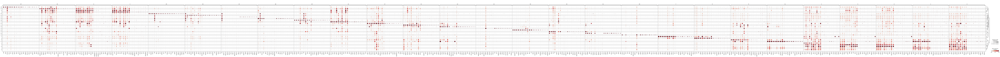

In [76]:
sc.tl.rank_genes_groups(adata, groupby = clustering, method = 'wilcoxon')

n_genes = 10
gene_dict = pd.DataFrame(adata.uns['rank_genes_groups']['names']).iloc[:n_genes].to_dict(orient = 'list')
unique_dict = sec_high.T.apply(lambda x: x.nlargest(n_genes).index).to_dict(orient = 'list')
for cl in gene_dict.keys():
    gene_dict[cl].extend(unique_dict[cl])

fig = plot_dotplot_with_annotations(adata, var_names = gene_dict, groupby = clustering, standard_scale = 'var', dendrogram = True)
fig.savefig(os.path.join(main_path, 'Figures', f'Dotplot_DEG_Unique_{clustering}.pdf'), bbox_inches = 'tight')

# Read in data again

In [4]:
main_path = '/mnt/storage/karla/data/hao/'
adata = sc.read_h5ad(os.path.join(main_path, 'KC_full_samples_scaled_Integration_tests.h5ad'), backed = 'r+')
adata

AnnData object with n_obs × n_vars = 254591 × 75464 backed at '/mnt/storage/karla/data/hao/KC_full_samples_scaled_Integration_tests.h5ad'
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleType', 'SampledSiteC

## Get existing annotation level2

In [5]:
main_path = '/mnt/storage/karla/data/hao/'
hao_data = sc.read_h5ad(os.path.join(main_path, 'KC_Individually_scaled_Integration_Tests_FilteredGenes_Hvg.h5ad'), backed = 'r')
hao_data

AnnData object with n_obs × n_vars = 254591 × 33665 backed at '/mnt/storage/karla/data/hao/KC_Individually_scaled_Integration_Tests_FilteredGenes_Hvg.h5ad'
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Ambiguity', 'Exon', 'Intergenic', 'Intron', 'Unmapped', 'plateID', 'indices', 'WellID', 'donor', 'group', 'bodysite', 'nReads', 'rRNA', 'pct_exon', 'ProtocolTissueDissociation', 'PlateID', 'n_genes', 'pct_counts_rRNA', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'merge_by', 'S_score', 'G2M_score', 'phase', 'leiden_1_001', 'leiden_1_002', 'leiden_1_003', 'leiden_1_005', 'leiden_1_008', 'leiden_1_010', 'leiden_1_012', 'leiden_1_015', 'leiden_1_020', 'leiden_1_030', 'leiden_1_050', 'leiden_1_080', 'leiden_1_100', 'leiden_1_120', 'leiden_1_150', 'leiden_1_200', 'leiden_1_300', 'select', 'leiden_1', 'Y_X_ratio', 'percent.mt', 'Patient', '_UMAP1', '_UMAP2', '_tSNE1', '_tSNE2', 'DonorID_short', 'Age', 'Sex', 'Ethnicity1', 'SubjectType', 'SampleID', 'SampleTy

## Chosen integrations

ax = axes[ix // ncols, ix % ncols]


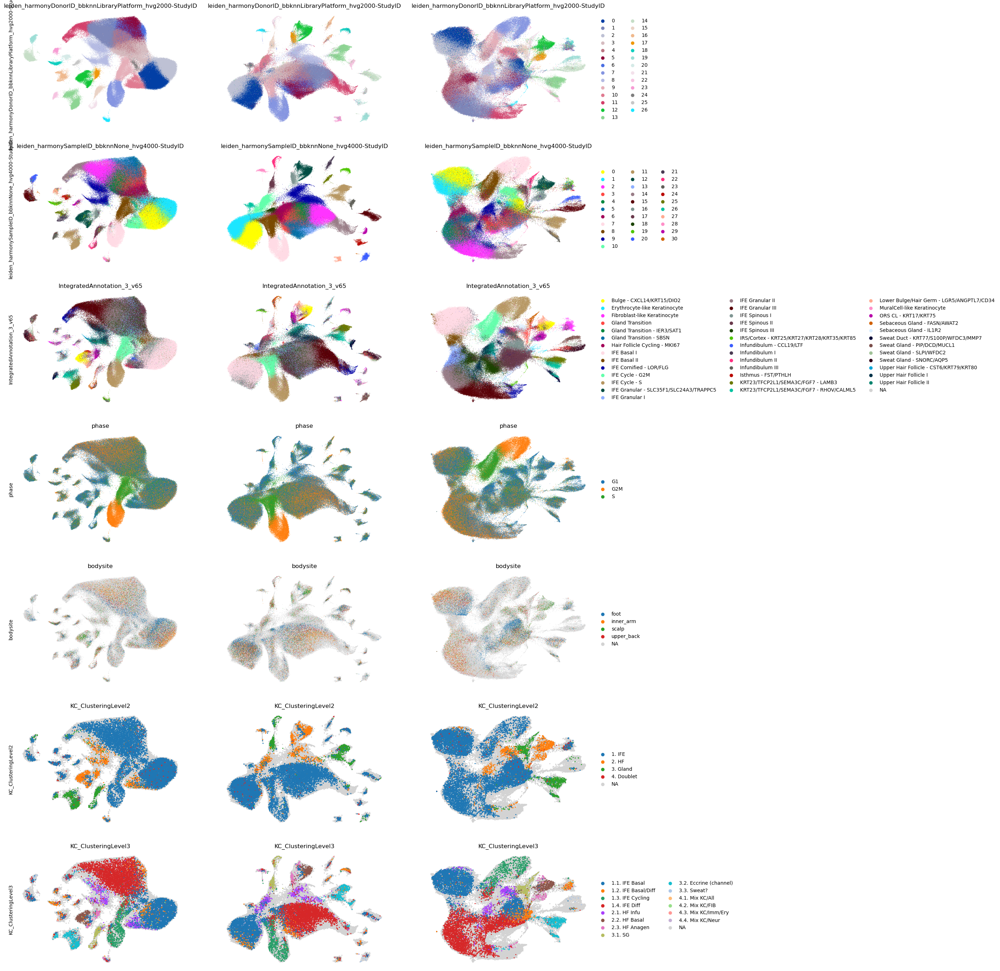

In [11]:
umaps = ['umap_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID', 'umap_harmonySampleID_bbknnNone_hvg4000-StudyID', 'umap_2_imbalance']
colors = ['leiden_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID', 'leiden_harmonySampleID_bbknnNone_hvg4000-StudyID', 'IntegratedAnnotation_3_v65', 'phase', 'bodysite', 'KC_ClusteringLevel2', 'KC_ClusteringLevel3']

ncols = len(umaps)
plots = len(umaps)*len(colors)
fig, axes = initialize_subplots(plots, ncols = ncols)

for col, umap in enumerate(umaps):
    for row, color in enumerate(colors):
        ax = axes[row, col]
        sc.pl.embedding(adata, color=color, basis=umap, show=False, ax=ax, s= 2 if 'KC' not in color else 20,
                        legend_loc='right margin' if col == (ncols-1) else None)
        
        if col == 0:
            ax.set_ylabel(color)
        else:
            ax.set_ylabel('')
        ax.set_xlabel('')
        [spine.set_visible(False) for spine in ax.spines.values()]

# Save

In [49]:
main_path = '/mnt/storage/karla/data/hao/'
adata.write_h5ad(os.path.join(main_path, 'KC_full_samples_scaled_Integration_tests.h5ad'))

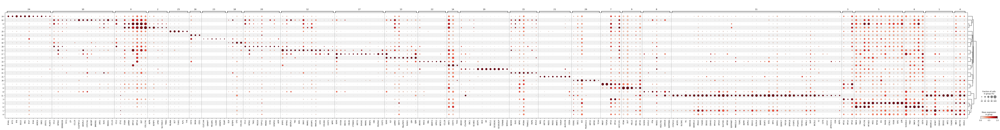

In [326]:
marker_genes = {'0': ['CCL2', 'ETV2', 'ITGB4', 'LAMB4', 'KRT15', 'KRT14', 'DST', 'COL17A1'], 
	'1': ['PRSS3', 'AADACL2', 'KCNK7', 'CWH43', 'DEGS2', 'KRT2', 'THEM5'],
	'2': ['ASPN', 'IGFBP3', 'LFNG', 'SLC39A13', 'TNNI2'],
	'3': ['MT1G', 'MT1H', 'MT1E'],
	'4': ['BBC3', 'ZNF750', 'OVOL1'],
	'5': ['NACA', 'TMA7', 'MT-CYB', 'MT-ND3', 'HES1', 'INTS6', 'ID1', 'RHOB', 'CCNL1', 'FOSB', 'IER2', 'JUN'],
	'6': ['S100A14', 'TMA7', 'NACA', 'MT-CYB', 'OST4'],
	'7': ['MKI67', 'TOP2A', 'MT1E', 'MT1G', 'HCFC1R1'],
	'8': ['SUSD4', 'CHI3L2', 'PTN', 'RASD1', 'HSD17B2', 'CARD18', 'SERPINB4'],
	'9': ['PCNA', 'DUT', 'HELLS', 'RECQL', 'DPY30'],
	'10': ['CCL2', 'NTRK2', 'DENND2B', 'TP73', 'LTF', 'CCL19', 'C1QTNF12', 'ADGRL3', 'CYP27A1', 'ABI3BP', 'BMERB1', 'LMO1', 'DLK2', 'MOXD1', 'CCL19'],
	'11': ['CYP4F22', 'ACER1', 'SLC8A1', 'IVL', 'FAM25A', 'AADACL2', 'PRSS3', 'THEM5', 'DEGS2', 'CWH43', 'MYH14', 'EPHX3', 'SULT2B1', 'KRT80', 'SERPINB7', 'MAB21L4', 'TGM3', 'BSPRY', 'A2ML1', 'RDH12', 'ELOVL4', 'SMIM5', 'DGAT2', 'SCEL', 'KRT2', 'DHRS1', 'SDR9C7', 'POF1B', 'SPRR1B', 'CYSRT1', 'PTGER3', 'TM7SF2', 'NIPAL1', 'SVIP', 'BICDL2', 'F3', 'CST6', 'LCE1C', 'ATP6V1C2', 'CGN', 'ASPG'],
	'12': ['SFRP1', 'NTRK2', 'ADGRL3', 'TNC', 'ISM1', 'DKK3', 'PAMR1', 'EFEMP1', 'FAM13A', 'LHX2', 'COL9A2', 'CHST2', 'NPPC'],
	'13': ['SOX9', 'FST', 'LAMB3', 'DDIT3', 'PNLIPRP3', 'RUNX1', 'LBH', 'GJB6'],
	'14': ['HINT1', 'COX7C', 'TESC'],
	'15': ['NEDD9', 'DLK2', 'NPM3', 'PFDN4', 'TINAGL1', 'PDPN', 'ACSL4'],
	'16': ['CD74', 'SRGN', 'CD52'],
	'17': ['SOX9', 'FXYD6', 'DACH1', 'CBLN2', 'CTNND2', 'KRT75', 'SHISA2', 'PARM1', 'MFAP2', 'CBS', 'PDZRN3', 'CHST2'],
	'18': ['ELN', 'IGFBP4', 'CFD', 'COL1A2'],
	'19': ['ANXA3', 'C5orf46', 'ENC1', 'SCUBE2', 'AZGP1', 'DCD', 'PIP', 'MUCL1', 'SCGB2A2', 'SCGB1B2P', 'TSPAN8', 'SERHL2'],
	'20': ['CCL2', 'NTRK2', 'TNS1', 'RGS16', 'TSPYL2', 'MSRB3', 'CCN2', 'SYNPO2', 'A2M'],
	'21': ['FAR2', 'KRT79', 'FADS1', 'FADS2', 'AWAT2', 'THRSP', 'ALOX15B', 'CIDEA'],
	'22': ['ANXA3', 'RHCG', 'MAL', 'WDR72', 'GPR12', 'WFDC3', 'CCL28'],
	'23': ['CLEC14A', 'GIMAP7', 'PECAM1', 'CLDN5', 'GIMAP4', 'PLVAP'],
	'24': ['IFI44L', 'IFIT3', 'IFI6', 'ISG15', 'MX1', 'IFI27', 'IFI44', 'HERC6', 'OAS1', 'EPSTI1', 'PLAAT4'],
	'25': ['MLANA','DCT','TYRP1', 'PLP1', 'TYR'],
	'26': ['FOXN1', 'ODC1', 'ID3', 'PSORS1C2', 'KRT25', 'KRT85', 'TCHH']}
marker_genes = {cl: marker_genes[cl] for cl in adata.uns['dendrogram_leiden_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID']['categories_ordered']}
dot_fig = plot_dotplot_with_annotations(adata, var_names = marker_genes, groupby = clustering, standard_scale = 'var', return_fig = True, dendrogram = True)

[dot_fig.savefig(os.path.join(main_path, 'Figures', f'DEG_DESeq2_Dotplot_Selected_comparisons_signature_genes.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

In [332]:
sc.tl.rank_genes_groups(adata, groupby = clustering, method = 'logreg', key_added = 'rank_genes_groups_logreg', layer = 'raw_counts_log')

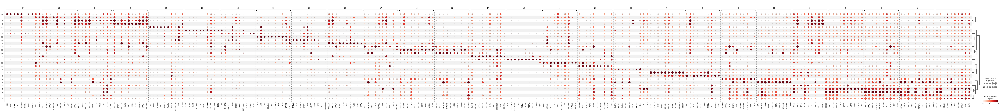

In [347]:
logreg_genes = pd.DataFrame(adata.uns['rank_genes_groups_logreg']['names']).head(10).to_dict(orient = 'list')
logreg_genes = {cl: logreg_genes[cl] for cl in adata.uns['dendrogram_leiden_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID']['categories_ordered']}
deg_logreg_fig = plot_dotplot_with_annotations(adata, var_names = logreg_genes, groupby = clustering, dendrogram = True, return_fig = True, standard_scale = 'var')

[None, None]

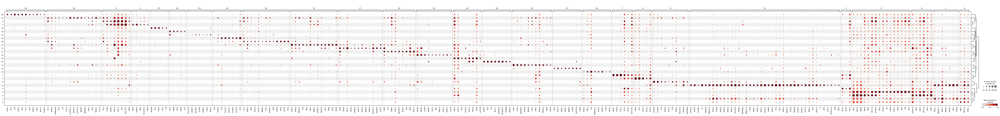

In [350]:
marker_genes = {'0': ['CCL2', 'ITGB4', 'LAMB4', 'KRT15', 'KRT14', 'DST', 'COL17A1', 'AREG'], 
	'1': ['PRSS3', 'AADACL2', 'KCNK7', 'CWH43', 'DEGS2', 'KRT2', 'THEM5'],
	'2': ['ASPN', 'IGFBP3', 'LFNG', 'SLC39A13', 'TNNI2'],
	'3': ['MT1G', 'MT1H', 'MT1E'],
	'4': ['BBC3', 'ZNF750', 'OVOL1'],
	'5': ['KRT1', 'KRT10', 'DMKN', 'NACA', 'TMA7', 'MT-CYB', 'MT-ND3', 'HES1', 'INTS6', 'ID1', 'RHOB', 'CCNL1', 'FOSB', 'IER2', 'JUN', 'ATF3'],
	'6': ['S100A14', 'TMA7', 'NACA', 'MT-CYB', 'OST4', 'PERP',],
	'7': ['MKI67', 'TOP2A', 'PTTG1', 'MT1E', 'MT1G', 'HCFC1R1'],
	'8': ['S100A8', 'S100A9', 'PTN', 'SUSD4', 'CHI3L2', 'PTN', 'RASD1', 'HSD17B2', 'CARD18', 'SERPINB4'],
	'9': ['PCNA', 'DUT', 'HELLS', 'RECQL', 'DPY30'],
	'10': ['CCL2', 'NTRK2', 'DENND2B', 'TP73', 'LTF', 'CCL19', 'C1QTNF12', 'ADGRL3', 'CYP27A1', 'ABI3BP', 'BMERB1', 'LMO1', 'DLK2', 'MOXD1', 'CCL19'],
	'11': ['CYP4F22', 'ACER1', 'SLC8A1', 'IVL', 'FAM25A', 'AADACL2', 'PRSS3', 'THEM5', 'DEGS2', 'CWH43', 'MYH14', 'EPHX3', 'SULT2B1', 'KRT80', 'SERPINB7', 'MAB21L4', 'TGM3', 'BSPRY', 'A2ML1', 'RDH12', 'ELOVL4', 'SMIM5', 'DGAT2', 'SCEL', 'KRT2', 'DHRS1', 'SDR9C7', 'POF1B', 'SPRR1B', 'CYSRT1', 'PTGER3', 'TM7SF2', 'NIPAL1', 'SVIP', 'BICDL2', 'F3', 'CST6', 'LCE1C', 'ATP6V1C2', 'CGN', 'ASPG'],
	'12': ['SFRP1', 'NTRK2', 'ADGRL3', 'TNC', 'ISM1', 'DKK3', 'PAMR1', 'EFEMP1', 'FAM13A', 'LHX2', 'FRZB', 'DIO2', 'BCAM'],
	'13': ['SOX9', 'FST', 'LAMB3', 'DDIT3', 'PNLIPRP3', 'RUNX1', 'LBH', 'GJB6', 'KRT23'],
	'14': ['HINT1', 'COX7C', 'TESC', 'S100A1', 'KRT19', 'KRT18', 'LDHA', 'COX7A1'],
	'15': ['SAA1', 'IL1R2', 'SERPINF1', 'CYP4F8', 'NEDD9', 'DLK2', 'NPM3', 'PFDN4', 'TINAGL1', 'PDPN', 'ACSL4'],
	'16': ['CD74', 'SRGN', 'CD52', 'CREM', 'IL32'],
	'17': ['SOX9', 'FXYD6', 'KRT17', 'CBLN2', 'CTNND2', 'KRT75', 'SHISA2', 'PARM1', 'MFAP2', 'SOSTDC1', 'PDZRN3', 'CHST2'],
	'18': ['ELN', 'IGFBP4', 'CFD', 'COL1A2', 'COL1A1', 'COL6A2','COL3A1', 'DCN'],
	'19': ['AZGP1', 'DCD', 'PIP', 'MUCL1', 'SCGB2A2', 'SCGB1B2P', 'TSPAN8', 'SERHL2'],
	'20': ['CCL2', 'NTRK2', 'TNS1', 'RGS16', 'TSPYL2', 'MSRB3', 'CCN2', 'SYNPO2', 'A2M', 'TAGLN', 'MYL9','ACTA2','TPM2'],
	'21': ['FAR2', 'KRT79', 'FADS1', 'FADS2', 'AWAT2', 'THRSP', 'ALOX15B', 'CIDEA'],
	'22': ['KRT6A','KRT6B', 'S100P', 'ANXA3', 'RHCG', 'MAL', 'WDR72', 'GPR12', 'WFDC3', 'CCL28'],
	'23': ['CLEC14A', 'GIMAP7', 'PECAM1', 'CLDN5', 'GIMAP4', 'PLVAP', 'GNG11'],
	'24': ['IFI44L', 'IFIT3', 'IFI6', 'ISG15', 'MX1', 'IFI27', 'IFI44', 'HERC6', 'OAS1', 'EPSTI1', 'PLAAT4'],
	'25': ['MLANA','DCT','TYRP1', 'PLP1', 'TYR'],
	'26': ['FOXN1', 'ODC1', 'ID3', 'PSORS1C2', 'KRT25', 'KRT85', 'TCHH', 'KRT28']}
	
marker_genes = {cl: marker_genes[cl] for cl in adata.uns['dendrogram_leiden_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID']['categories_ordered']}
dot_fig = plot_dotplot_with_annotations(adata, var_names = marker_genes, groupby = clustering, standard_scale = 'var', return_fig = True, dendrogram = True)

[dot_fig.savefig(os.path.join(main_path, 'Figures', f'DEG_DESeq2_Dotplot_Selected_comparisons_signature_genes_v2.{f}'), bbox_inches = 'tight') for f in ['pdf','png']]

In [352]:
def plot_grouped_umaps_for_marker_genes(adata, gene_dict, groupby, basis = 'X_umap', ncols = 10, row_spacer = 0, s = 50, figsize_multiplier = (5, 3), ylabel_fontsize = 16, **kwargs):
    # Calculate the number of rows needed for each group and total them
    rows = [np.ceil(len(genes)/ncols).astype('int') for genes in gene_dict.values()]
    nrows = np.sum(rows)
    
    # Generate height ratios for the grid layout, adding small spaces between rows
    height_ratios = []
    for i in rows:
        [height_ratios.append(1) for _ in range(i)] # Append 1 for each row required by the group
        height_ratios.append(row_spacer) # Append a small space after each group
    
    # Initialize the figure with specified height ratios and zero spacing between subplots
    fig, axes = plt.subplots(len(height_ratios), ncols, figsize=(figsize_multiplier[0] * ncols, (figsize_multiplier[1] * nrows) + len(rows)*0.1), gridspec_kw = {'wspace': 0.00, 'hspace': 0.0, 'height_ratios': height_ratios})
    
    # Variables to track the current position in the grid
    current_col = 0
    current_row = 0
    
    # Loop through each cell type and its corresponding genes
    for cl, genes in gene_dict.items():
        first_item = True # Flag to control execution for the first gene of each group
        
        # Process genes
        for ix, g in enumerate(genes):
            ax = axes[current_row, current_col] # Get the current axis
    
            # Plot UMAP for the gene, remove colorbar, and adjust title
            sc.pl.embedding(adata, color = g, basis = basis, show = False, ax = ax, frameon = True, s = s, **kwargs)
            ax.collections[0].colorbar.remove()
            ax.set_title(ax.get_title(), y = 0.9)
            ax.set_ylabel('')
            ax.set_xlabel('')
    
            # Adjust the x and y limits to add a margin around the plots
            xlim = ax.get_xlim()
            ylim = ax.get_ylim()
            ax.set_xlim(left = xlim[0]-0.1*xlim[0], right = xlim[1]+0.1*xlim[1])
            ax.set_ylim(bottom = ylim[0]-0.1*ylim[0], top = ylim[1]+0.1*ylim[1])
    
            # For the first gene of each group, add an inset UMAP highlighting the group
            if first_item:
                inset_ax = inset_axes(ax, width='20%', height='20%', loc=2)
                sc.pl.embedding(adata, ax = inset_ax, basis = basis, show = False, frameon = False)
                sc.pl.embedding(adata, color = groupby, groups = cl, basis = basis, ax = inset_ax, show = False, frameon = False, title = '', legend_loc = None)
                ax.set_ylabel(cl, fontsize = ylabel_fontsize)
                first_item = False
    
            # Make spines invisible, only make visible the relevant spines for a clean grid appearance
            [spine.set_visible(False) for spine in ax.spines.values()]
            if current_col == 0: # left side axes for left column
                ax.spines['left'].set_visible(True)
            if (current_col == ncols-1) | (ix == len(genes)-1): #right side axes, including when there are not enough plots to fill out the figure row
                ax.spines['right'].set_visible(True)
            if ix < ncols: # top spines for first row
                ax.spines['top'].set_visible(True)
            if ix > (len(genes)-ncols-1): #bottom axes, including the "overhanging" plots
                ax.spines['bottom'].set_visible(True) 
    
            # Move to the next subplot, wrapping around to the next row if necessary
            if current_col == ncols-1:
                current_col = 0
                current_row += 1
            else:
                current_col+=1
    
        # After finishing all genes for a group, make the remaining axes in the row invisible
        if current_col != 0:
            [ax.set_visible(False) for ax in axes[current_row, current_col:]]
            current_col = 0 #Reset the column index
            current_row += 1 #Move to next row (spacer)
        [ax.set_visible(False) for ax in axes[current_row, current_col:]] #Clean up spacer row
        current_row += 1 #Move to the actual plotting row
    clear_output()
    fig = plt.gcf()
    return fig

In [ ]:
marker_genes = {'0': ['CCL2', 'ITGB4', 'LAMB4', 'KRT15', 'KRT14', 'DST', 'COL17A1', 'AREG'], 
	'1': ['PRSS3', 'AADACL2', 'KCNK7', 'CWH43', 'DEGS2', 'KRT2', 'THEM5'],
	'2': ['ASPN', 'IGFBP3', 'LFNG', 'SLC39A13', 'TNNI2'],
	'3': ['MT1G', 'MT1H', 'MT1E'],
	'4': ['BBC3', 'ZNF750', 'OVOL1'],
	'5': ['KRT1', 'KRT10', 'DMKN', 'NACA', 'TMA7', 'MT-CYB', 'MT-ND3', 'HES1', 'INTS6', 'ID1', 'RHOB', 'CCNL1', 'FOSB', 'IER2', 'JUN', 'ATF3'],
	'6': ['S100A14', 'TMA7', 'NACA', 'MT-CYB', 'OST4', 'PERP',],
	'7': ['MKI67', 'TOP2A', 'PTTG1', 'MT1E', 'MT1G', 'HCFC1R1'],
	'8': ['S100A8', 'S100A9', 'PTN', 'SUSD4', 'CHI3L2', 'PTN', 'RASD1', 'HSD17B2', 'CARD18', 'SERPINB4'],
	'9': ['PCNA', 'DUT', 'HELLS', 'RECQL', 'DPY30'],
	'10': ['CCL2', 'NTRK2', 'DENND2B', 'TP73', 'LTF', 'CCL19', 'C1QTNF12', 'ADGRL3', 'CYP27A1', 'ABI3BP', 'BMERB1', 'LMO1', 'DLK2', 'MOXD1', 'CCL19'],
	'11': ['CYP4F22', 'ACER1', 'SLC8A1', 'IVL', 'FAM25A', 'AADACL2', 'PRSS3', 'THEM5', 'DEGS2', 'CWH43', 'MYH14', 'EPHX3', 'SULT2B1', 'KRT80', 'SERPINB7', 'MAB21L4', 'TGM3', 'BSPRY', 'A2ML1', 'RDH12', 'ELOVL4', 'SMIM5', 'DGAT2', 'SCEL', 'KRT2', 'DHRS1', 'SDR9C7', 'POF1B', 'SPRR1B', 'CYSRT1', 'PTGER3', 'TM7SF2', 'NIPAL1', 'SVIP', 'BICDL2', 'F3', 'CST6', 'LCE1C', 'ATP6V1C2', 'CGN', 'ASPG'],
	'12': ['SFRP1', 'NTRK2', 'ADGRL3', 'TNC', 'ISM1', 'DKK3', 'PAMR1', 'EFEMP1', 'FAM13A', 'LHX2', 'FRZB', 'DIO2', 'BCAM'],
	'13': ['SOX9', 'FST', 'LAMB3', 'DDIT3', 'PNLIPRP3', 'RUNX1', 'LBH', 'GJB6', 'KRT23'],
	'14': ['HINT1', 'COX7C', 'TESC', 'S100A1', 'KRT19', 'KRT18', 'LDHA', 'COX7A1'],
	'15': ['SAA1', 'IL1R2', 'SERPINF1', 'CYP4F8', 'NEDD9', 'DLK2', 'NPM3', 'PFDN4', 'TINAGL1', 'PDPN', 'ACSL4'],
	'16': ['CD74', 'SRGN', 'CD52', 'CREM', 'IL32'],
	'17': ['SOX9', 'FXYD6', 'KRT17', 'CBLN2', 'CTNND2', 'KRT75', 'SHISA2', 'PARM1', 'MFAP2', 'SOSTDC1', 'PDZRN3', 'CHST2'],
	'18': ['ELN', 'IGFBP4', 'CFD', 'COL1A2', 'COL1A1', 'COL6A2','COL3A1', 'DCN'],
	'19': ['AZGP1', 'DCD', 'PIP', 'MUCL1', 'SCGB2A2', 'SCGB1B2P', 'TSPAN8', 'SERHL2'],
	'20': ['CCL2', 'NTRK2', 'TNS1', 'RGS16', 'TSPYL2', 'MSRB3', 'CCN2', 'SYNPO2', 'A2M', 'TAGLN', 'MYL9','ACTA2','TPM2'],
	'21': ['FAR2', 'KRT79', 'FADS1', 'FADS2', 'AWAT2', 'THRSP', 'ALOX15B', 'CIDEA'],
	'22': ['KRT6A','KRT6B', 'S100P', 'ANXA3', 'RHCG', 'MAL', 'WDR72', 'GPR12', 'WFDC3', 'CCL28'],
	'23': ['CLEC14A', 'GIMAP7', 'PECAM1', 'CLDN5', 'GIMAP4', 'PLVAP', 'GNG11'],
	'24': ['IFI44L', 'IFIT3', 'IFI6', 'ISG15', 'MX1', 'IFI27', 'IFI44', 'HERC6', 'OAS1', 'EPSTI1', 'PLAAT4'],
	'25': ['MLANA','DCT','TYRP1', 'PLP1', 'TYR'],
	'26': ['FOXN1', 'ODC1', 'ID3', 'PSORS1C2', 'KRT25', 'KRT85', 'TCHH', 'KRT28']}

fig_umap_markers = plot_grouped_umaps_for_marker_genes(adata, gene_dict, clustering, basis = 'umap_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID', cmap = new_cmap)
[fig_umap_markers.savefig(os.path.join(main_path, 'Figures', f'DEG_UMAP_Selected_Genes.{f}')) for f in ['pdf','png']]

# Checkpoint to save the added annotations

In [7]:
main_path = '/mnt/storage/karla/data/hao/'
adata.write_h5ad(os.path.join(main_path, 'KC_full_samples_scaled_Integration_tests.h5ad'))

In [1005]:
def helper_for_bodysite(row):
    l1 = row['AnatomicalRegionLevel1']
    l2 = row['AnatomicalRegionLevel2']
    if isinstance(l2, str):
        return l2
    if isinstance(l1, str):
        return l1
    return 'Unknown'
adata.obs['AnatomicalRegionLevel1_2_combined'] = adata.obs.apply(lambda row: helper_for_bodysite(row), axis = 1)

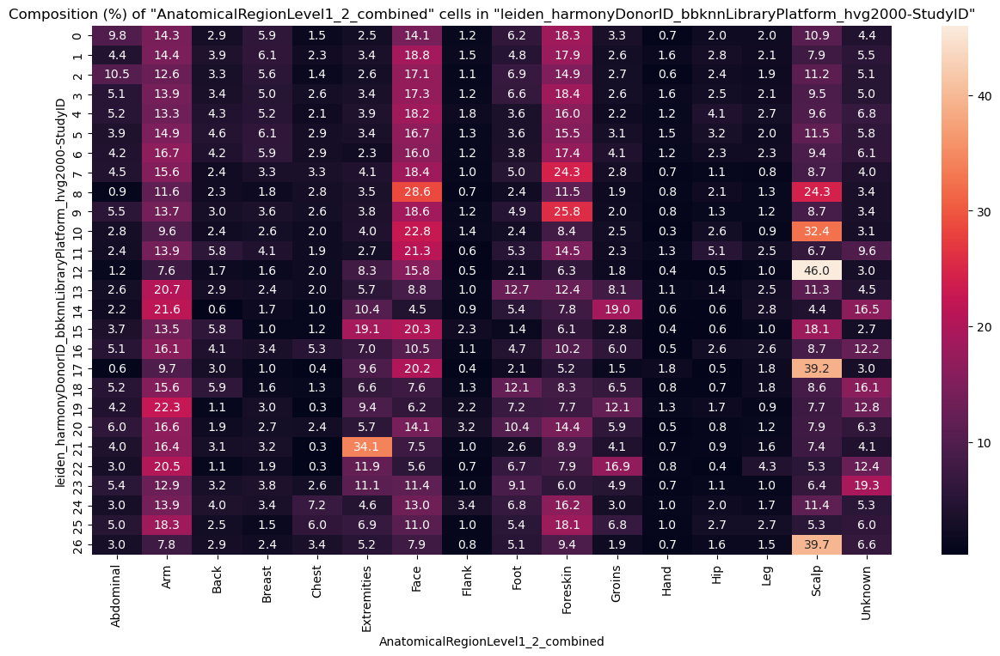

In [1006]:
fig, ax = plt.subplots(figsize = (15, 8))
plot_group_composition_heatmap(adata.obs, groupby_name=clustering, count_group_name='AnatomicalRegionLevel1_2_combined', ax = ax, fmt = '3.1f')

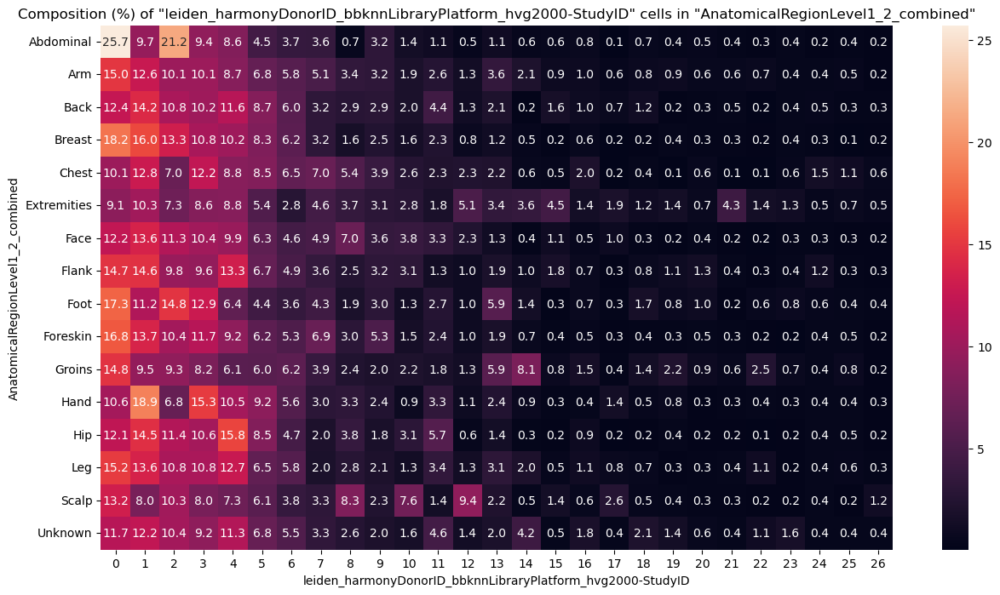

In [1007]:
fig, ax = plt.subplots(figsize = (15, 8))
plot_group_composition_heatmap(adata.obs, groupby_name='AnatomicalRegionLevel1_2_combined', count_group_name=clustering, ax = ax, fmt = '3.1f')

/mnt/storage/karla/mamba/minimamba/envs/integration/lib/python3.10/site-packages/pandas/core/arraylike.py:399: RuntimeWarning:

divide by zero encountered in log10



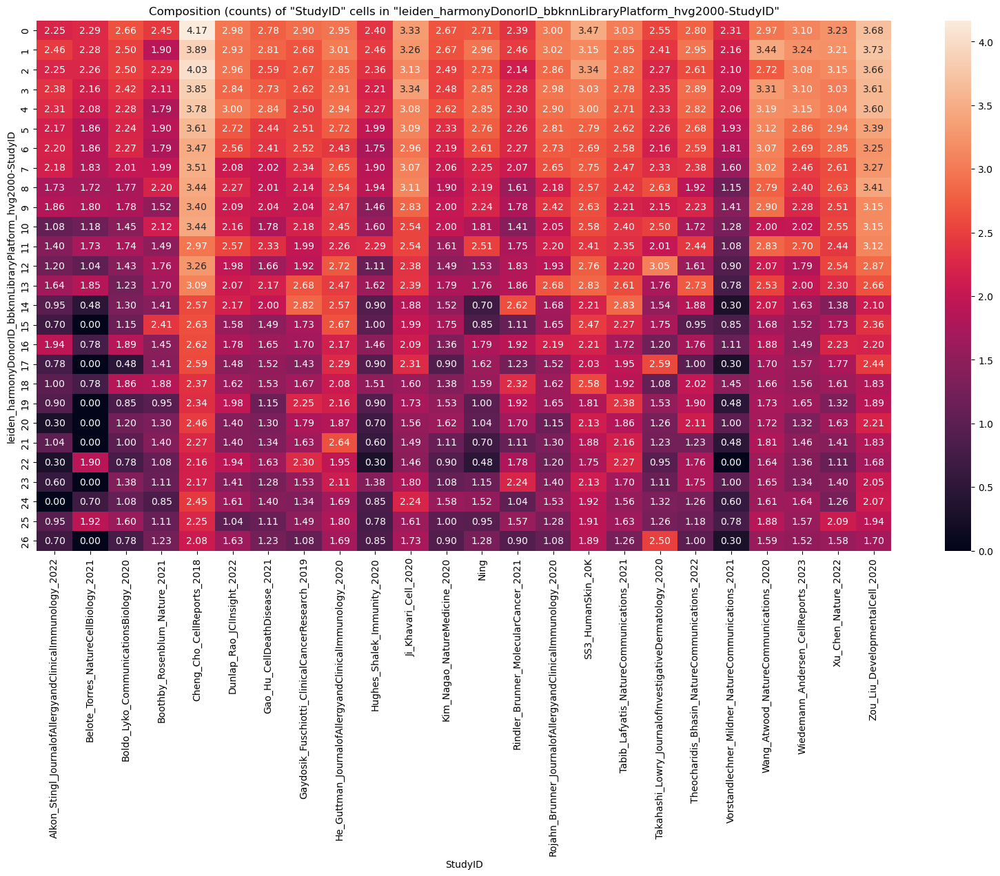

In [909]:
fig, ax = plt.subplots(figsize = (20, 10))
plot_group_composition_heatmap(adata.obs, groupby_name=clustering, count_group_name = 'StudyID', ax = ax, percentage = False, fmt = '1.2f', show_log = True)

In [ ]:
marker_genes = {'0': ['CCL2', 'ITGB4', 'LAMB4', 'KRT15', 'KRT14', 'DST', 'COL17A1', 'AREG'], 
	'1': ['PRSS3', 'AADACL2', 'KCNK7', 'CWH43', 'DEGS2', 'KRT2', 'THEM5'],
	'2': ['ASPN', 'IGFBP3', 'LFNG', 'SLC39A13', 'TNNI2'],
	'3': ['MT1G', 'MT1H', 'MT1E'],
	'4': ['BBC3', 'ZNF750', 'OVOL1'],
	'5': ['KRT1', 'KRT10', 'DMKN', 'NACA', 'TMA7', 'MT-CYB', 'MT-ND3', 'HES1', 'INTS6', 'ID1', 'RHOB', 'CCNL1', 'FOSB', 'IER2', 'JUN', 'ATF3'],
	'6': ['S100A14', 'TMA7', 'NACA', 'MT-CYB', 'OST4', 'PERP',],
	'7': ['MKI67', 'TOP2A', 'PTTG1', 'MT1E', 'MT1G', 'HCFC1R1'],
	'8': ['S100A8', 'S100A9', 'PTN', 'SUSD4', 'CHI3L2', 'PTN', 'RASD1', 'HSD17B2', 'CARD18', 'SERPINB4', 'GATA6'],
	'9': ['PCNA', 'DUT', 'HELLS', 'RECQL', 'DPY30'],
	'10': ['CCL2', 'NTRK2', 'DENND2B', 'TP73', 'LTF', 'CCL19', 'C1QTNF12', 'ADGRL3', 'CYP27A1', 'ABI3BP', 'BMERB1', 'LMO1', 'DLK2', 'MOXD1', 'CCL19'],
	'11': ['CYP4F22', 'ACER1', 'SLC8A1', 'IVL', 'FAM25A', 'AADACL2', 'PRSS3', 'THEM5', 'DEGS2', 'CWH43', 'MYH14', 'EPHX3', 'SULT2B1', 'KRT80', 'SERPINB7', 'MAB21L4', 'TGM3', 'BSPRY', 'A2ML1', 'RDH12', 'ELOVL4', 'SMIM5', 'DGAT2', 'SCEL', 'KRT2', 'DHRS1', 'SDR9C7', 'POF1B', 'SPRR1B', 'CYSRT1', 'PTGER3', 'TM7SF2', 'NIPAL1', 'SVIP', 'BICDL2', 'F3', 'CST6', 'LCE1C', 'LCE1A', 'LCE1B', 'LCE1D', 'LCE2C', 'LCE3D', 'ATP6V1C2', 'CGN', 'ASPG'],
	'12': ['SFRP1', 'NTRK2', 'ADGRL3', 'TNC', 'ISM1', 'DKK3', 'PAMR1', 'EFEMP1', 'FAM13A', 'LHX2', 'FRZB', 'DIO2', 'BCAM', 'LGR5', 'GLI1'],
	'13': ['SOX9', 'FST', 'LAMB3', 'DDIT3', 'PNLIPRP3', 'RUNX1', 'LBH', 'GJB6', 'KRT23'],
	'14': ['HINT1', 'COX7C', 'TESC', 'S100A1', 'KRT19', 'KRT18', 'LDHA', 'COX7A1'],
	'15': ['SAA1', 'IL1R2', 'SERPINF1', 'CYP4F8', 'NEDD9', 'DLK2', 'NPM3', 'PFDN4', 'TINAGL1', 'PDPN', 'ACSL4'],
	'16': ['CD74', 'SRGN', 'CD52', 'CREM', 'IL32', 'PTPRC', 'CD3G'],
	'17': ['SOX9', 'FXYD6', 'KRT17', 'CBLN2', 'CTNND2', 'KRT75', 'SHISA2', 'PARM1', 'MFAP2', 'SOSTDC1', 'PDZRN3', 'CHST2'],
	'18': ['ELN', 'IGFBP4', 'CFD', 'COL1A2', 'COL1A1', 'COL6A2','COL3A1', 'DCN'],
	'19': ['AZGP1', 'DCD', 'PIP', 'MUCL1', 'SCGB2A2', 'SCGB1B2P', 'TSPAN8', 'SERHL2'],
	'20': ['CCL2', 'NTRK2', 'TNS1', 'RGS16', 'TSPYL2', 'MSRB3', 'CCN2', 'SYNPO2', 'A2M', 'TAGLN', 'MYL9','ACTA2','TPM2'],
	'21': ['FAR2', 'KRT79', 'FADS1', 'FADS2', 'AWAT2', 'THRSP', 'ALOX15B', 'CIDEA'],
	'22': ['KRT6A','KRT6B', 'S100P', 'ANXA3', 'RHCG', 'MAL', 'WDR72', 'GPR12', 'WFDC3', 'CCL28', 'NOTUM'],
	'23': ['CLEC14A', 'GIMAP7', 'PECAM1', 'CLDN5', 'GIMAP4', 'PLVAP', 'GNG11'],
	'24': ['IFI44L', 'IFIT3', 'IFI6', 'ISG15', 'MX1', 'IFI27', 'IFI44', 'HERC6', 'OAS1', 'EPSTI1', 'PLAAT4'],
	'25': ['MLANA','DCT','TYRP1', 'PLP1', 'TYR', 'SOX10'],
	'26': ['FOXN1', 'ODC1', 'ID3', 'PSORS1C2', 'KRT25', 'KRT85', 'TCHH', 'KRT28', 'KRT35']}

fig_umap_markers = plot_grouped_umaps_for_marker_genes(subsample_data, marker_genes, clustering, basis = 'umap_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID', cmap = new_cmap, layer = 'log-norm', s = 20)
[fig_umap_markers.savefig(os.path.join(main_path, 'Figures', f'DEG_UMAP_Selected_Genes.{f}')) for f in ['pdf','png']]

## Give colors to clusters

In [8]:
clusters = {
 '0': 'IFE_Basal_1',
 '1': 'IFE_Granular_2',
 '2': 'IFE_Granular_1',
 '3': 'IFE_Spinous_2',
 '4': 'IFE_Basal_2',
 '5': 'IFE_Basal_2',
 '6': 'IFE_Basal_1',
 '7': 'IFE_Granular_3',
 '8': 'IFE_Basal_2',
 '9': 'IFE_Granular_1',
 '10': 'IFE_Basal_2',
 '11': 'IFE_Granular_1',
 '12': 'IFE_Cycling_S',
 '13': 'IFE_Spinous_2',
 '14': 'IFE_Granular_2',
 '15': 'IFE_Spinous_2',
 '16': 'IFE_Cycling_G2M_2',
 '17': 'Infu_diff',
 '18': 'IFE_Basal_2',
 '19': 'IFE_Granular_2',
 '20': 'IFE_Granular_1',
 '21': 'Infu_basal_1',
 '22': 'IFE_Spinous_1',
 '23': 'IFE_Cycling_G2M_1',
 '24': 'IFE_Spinous_2',
 '25': 'HF_2',
 '26': 'uHF',
 '27': 'IFE_terminal_1',
 '28': 'IFE_Spinous_1',
 '29': 'Gland_Channel_1',
 '30': 'Gland_Sweat_1',
 '31': 'IFE_Spinous_1',
 '32': 'Gland_Channel_2',
 '33': 'SG_1',
 '34': 'IFE_terminal_2',
 '35': 'MIX_KC/Imm',
 '36': 'HF_1',
 '37': 'MIX_KC/FIB',
 '38': 'Infu_basal_2',
 '39': 'HF_3',
 '40': 'Gland_Sweat_2',
 '41': 'IFE_Spinous_2',
 '42': 'IFE_interferon',
 '43': 'MIX_KC/vSM',
 '44': 'SG_2',
 '45': 'Gland_Channel_3',
 '46': 'MIX_KC/EC',
 '47': 'Melanocytes',
 '48': 'HF_Anagen'
}

cmaps_basis = {
 'IFE_Basal_1': '#0fc702',
 'IFE_Basal_2': '#1cfc0d',
 'Infu_basal_1': '#14ffc8',
 'Infu_basal_2': '#44C797',
 'IFE_interferon': '#a1cc8f',
 'IFE_Cycling_S': '#6bba18',
 'IFE_Cycling_G2M_1': '#42c908',
 'IFE_Cycling_G2M_2': '#009900',
 'IFE_Spinous_1': '#a2ff00',
 'IFE_Spinous_2': '#eaff4a',
 'IFE_Granular_1': '#ffe600',
 'IFE_Granular_2': '#fa9600',
 'IFE_Granular_3': '#ff4d00',
 'IFE_terminal_1': '#e60000',
 'IFE_terminal_2': '#b30c00',
 'Infu_diff': '#fab68e',
 'uHF': '#55DDF2',
 'HF_1': '#7acbfa',
 'HF_2': '#65acfc',
 'HF_3': '#0d7dfc',
 'HF_Anagen': '#0246e3',
 'SG_1': '#9667e0',
 'SG_2': '#5f15d6',
 'Gland_Channel_1': '#fa70d1',
 'Gland_Channel_2': '#fc21bb',
 'Gland_Channel_3': '#ba0283',
 'Gland_Sweat_1': '#f682fa',
 'Gland_Sweat_2': '#f019f7',
 'Melanocytes': '#8B4513',
 'MIX_KC/Imm': '#d3d3d3',
 'MIX_KC/FIB': '#bfbfbf',
 'MIX_KC/vSM': '#a6a6a6',
 'MIX_KC/EC': '#8c8c8c'
}

cluster_order = ['IFE_Basal_1', 'IFE_Basal_2', 
                 'Infu_basal_1', 'Infu_basal_2', 
                 'IFE_interferon', 
                 'IFE_Cycling_S', 'IFE_Cycling_G2M_1', 'IFE_Cycling_G2M_2', 
                 'IFE_Spinous_1', 'IFE_Spinous_2', 
                 'IFE_Granular_1', 'IFE_Granular_2', 'IFE_Granular_3', 
                 'IFE_terminal_1', 'IFE_terminal_2', 
                 'Infu_diff', 'uHF', 
                 'HF_1', 'HF_2', 'HF_3', 'HF_Anagen', 
                 'SG_1', 'SG_2', 
                 'Gland_Channel_1', 'Gland_Channel_2', 'Gland_Channel_3', 
                 'Gland_Sweat_1', 'Gland_Sweat_2', 
                 'Melanocytes', 
                 'MIX_KC/Imm', 'MIX_KC/FIB', 'MIX_KC/vSM', 'MIX_KC/EC']

cluster_mapping = {k: f'{cluster_order.index(v)}: {v}' for k, v in clusters.items()}
cmaps = {f'{cluster_order.index(v)}: {v}': cmaps_basis[v] for k, v in clusters.items()}

adata.obs['clusters_annotated'] = adata.obs[f'leiden_res3_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID'].map(cluster_mapping)
adata.obs['clusters_annotated_numbers'] = [cl.split(':')[0] for cl in adata.obs['clusters_annotated']]

<Axes: title={'center': 'clusters_annotated'}, xlabel='umap_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID1', ylabel='umap_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID2'>

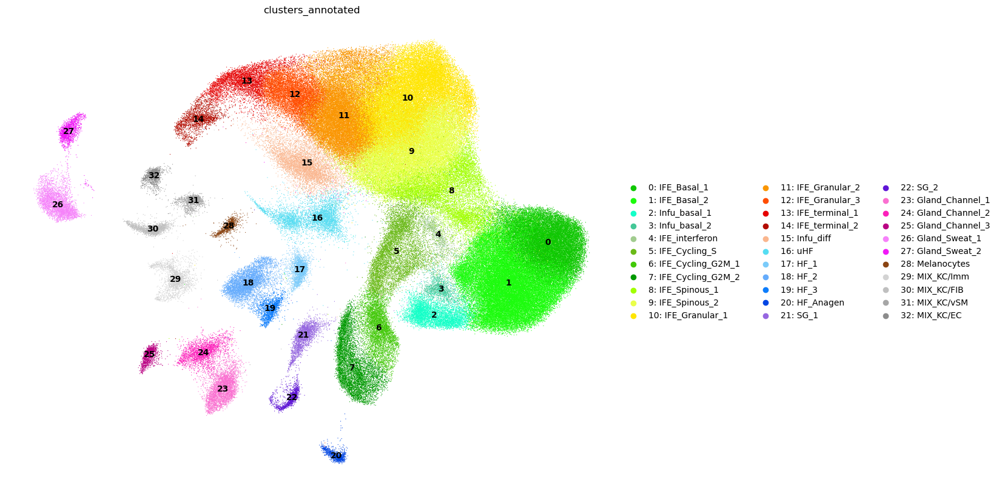

In [9]:
fig, axes = plt.subplots(figsize = (13, 10), ncols = 1)

ax = axes
sc.pl.embedding(adata, color = 'clusters_annotated_numbers', basis = 'umap_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID', s = 0, ax = ax, show = False, frameon = False, legend_loc = 'on data')
sc.pl.embedding(adata, color = 'clusters_annotated', basis = 'umap_harmonyDonorID_bbknnLibraryPlatform_hvg2000-StudyID', s = 3, ax = ax, show = False, frameon = False, palette = cmaps)

#[fig.savefig(os.path.join(main_path, 'Figures', f'KC_all_UMAP_main_clusters_level2.{f}'), bbox_inches = 'tight', dpi = 300) for f in ['png', 'pdf']]

# Save

In [ ]:
main_path = '/mnt/storage/karla/data/hao/'
adata.write_h5ad(os.path.join(main_path, 'KC_full_samples_scaled_Integration_tests_RainbowDuck.h5ad'))

This dataset was subsequently processed in 21_keratinocyte_Karl_v2_20260422.r to generate the final KC annotation object: cells were matched, level 2 annotations and UMAP coordinates were transferred, and metadata fields were harmonized with the other iHSCA datasets.